# Purpose: Create my own differenced images from the science and reference images so that I can implant streaks into them. I later switched my approach to just implant the streaks into the science image, which offers more information and better performance than the differenced image.

In [1]:
from astropy.io import fits
from astropy.io.fits import getdata
from astropy import wcs
from astropy.table import Table
from astropy.nddata import NDData
from astropy.visualization import LinearStretch, ZScaleInterval, ImageNormalize

from photutils import Background2D, MedianBackground, EPSFBuilder, find_peaks
from photutils.psf import extract_stars

from astroquery.jplhorizons import Horizons

import astroalign

from PIL import Image
import PIL

import ProperImage.properimage.single_image as si
import ProperImage.properimage.single_image_psfs as sip
import ProperImage.properimage.propersubtract as ps

import ois

import numpy as np
import requests
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
from multiprocessing import Pool
import pickle as pkl
import sep

import scipy.stats as stats

import random

import skimage

Error initializing plugin EntryPoint('Windows (alt)', 'keyrings.alt.Windows', None, Distribution('keyrings.alt', '3.0')).
Traceback (most recent call last):
  File "/home/fwang/.local/lib/python3.6/site-packages/keyring/backend.py", line 188, in _load_plugins
    init_func = ep.load()
  File "/home/fwang/.local/lib/python3.6/site-packages/entrypoints.py", line 82, in load
    mod = import_module(self.module_name)
  File "/usr/lib/python3.6/importlib/__init__.py", line 126, in import_module
    return _bootstrap._gcd_import(name[level:], package, level)
  File "<frozen importlib._bootstrap>", line 994, in _gcd_import
  File "<frozen importlib._bootstrap>", line 971, in _find_and_load
  File "<frozen importlib._bootstrap>", line 955, in _find_and_load_unlocked
  File "<frozen importlib._bootstrap>", line 665, in _load_unlocked
  File "<frozen importlib._bootstrap_external>", line 678, in exec_module
  File "<frozen importlib._bootstrap>", line 219, in _call_with_frames_removed
  File "/u

using pyfftw interfaces API


In [23]:
def normalize(arr):
    arr = np.copy(arr)
    vmin, vmax = ZScaleInterval(10000).get_limits(arr)
    arr -= vmin
    arr /= vmax - vmin
    arr = np.clip(arr, 0, 1)
    return (arr - 0.5) * 2

In [59]:
# generated from generate_streak_distribution.py
params_gamma_width = [4.79235037, 11.40523025, 1.64361626]
# for the values below use uniform dist instead
params_gamma_amplitude = [1.09717868, 1.99999993, 3.7169828]
params_gamma_length = [4.16396709, 8.0180058, 2.68969172]

number_streaks = 1
size = 156

# gain is the same for all images
gain = 6.2

amp_factor = 2

def gaussian(x, offset, std, amp):
    return amp * np.exp(-np.power(x - offset, 2.) / (2 * np.power(std, 2.)))


def gaussian_streak(width, offset, std, amp, bkg):
    dist = gaussian(np.arange(width), offset, std, amp) + bkg
    return dist


def implant_random_streak(image):

    image = np.copy(image)

    while True:
        std = stats.gamma.rvs(*params_gamma_width) * 0.05
        width = std * 10

        if random.random() < 0.7:
            length = stats.gamma.rvs(*params_gamma_length)
        else:
            length = np.random.random() * 30 + 10

        # use 2*std, which is "real" width
        if length / (std * 2) > 2 and length > 10 and width > 0:
            break

    streak = np.repeat(np.array([gaussian_streak(width, width / 2, std, 1, 0)]).T, length, axis=1)
    rotation = np.random.uniform(0, 360)
    streak = skimage.transform.rotate(streak, rotation, resize=True, order=3)

    y_len, x_len = image.shape
    y_len_streak, x_len_streak = streak.shape
    x_streak = np.random.randint(0, x_len - x_len_streak)
    y_streak = np.random.randint(0, y_len - y_len_streak)
    print(x_streak, y_streak)

    # amp_min = np.std(image[y_streak:y_streak + y_len_streak, x_streak:x_streak + x_len_streak]) * amp_factor
    amp_min = np.std(image[y_streak:y_streak + y_len_streak, x_streak:x_streak + x_len_streak]) * amp_factor

#     if random.random() < 0.9:
#         amplitude = amp_min * (1 + abs(np.random.randn()))
#     else:
#         amplitude = (np.random.random() * 5) * amp_min
    amplitude = amp_min

    streak *= amplitude

    # add shot noise
    streak = np.random.poisson(streak * gain)

    streak = streak / gain
    shape = streak.shape
    image[y_streak:y_streak + shape[0], x_streak:x_streak + shape[1]] += streak

    return image


# DIFFERENCING PARAMETERS
difference_size_ois = (200, 200)
difference_size_pi = (600, 600)
crop_size = (156, 156)

astroalign.MIN_MATCHES_FRACTION = 0.99
astroalign.PIXEL_TOL = 0.05
astroalign.NUM_NEAREST_NEIGHBORS = 5
astroalign.MAX_CONTROL_POINTS = 400


def remove_background(arr):
    bkg = Background2D(arr, (50, 50), mask=np.isnan(arr), bkg_estimator=MedianBackground()).background
    arr = arr - bkg
    bkg = Background2D(arr, (50, 50), mask=np.isnan(arr)).background
    return arr - bkg


# extract the effective psf of an image
def extract_epsf(image):
    peaks_tbl = find_peaks(image, 500)

    x = peaks_tbl['x_peak']
    y = peaks_tbl['y_peak']

    size = 25
    hsize = (size - 1) / 2

    mask = ((x > hsize) & (x < (image.shape[1] - 1 - hsize)) & (y > hsize) & (y < (image.shape[0] - 1 - hsize)))

    stars_tbl = Table()
    stars_tbl["x"] = x[mask]
    stars_tbl["y"] = y[mask]

    image_nddata = NDData(remove_background(image))

    stars = extract_stars(image_nddata, stars_tbl, size=size)

    psf_builder = EPSFBuilder()
    epsf, fitted_stars = psf_builder(stars)

    return epsf, fitted_stars


def align(sci, ref):
    transform, (source_list, target_list) = astroalign.find_transform(ref, sci)
    ref_aligned, footprint = astroalign.apply_transform(transform, ref, sci)
    return ref_aligned


def normalize_brightness(sci_image, ref_image):
    sci_epsf, sci_fitted_stars = extract_epsf(sci_image)
    sci_fluxes = np.array([star.estimate_flux() for star in sci_fitted_stars.all_good_stars])
    sci_flux = np.median(sci_fluxes)

    ref_epsf, ref_fitted_stars = extract_epsf(ref_image)
    ref_fluxes = np.array([star.estimate_flux() for star in ref_fitted_stars.all_good_stars])
    ref_flux = np.median(ref_fluxes)

    return ref_image * sci_flux/ref_flux


def difference(sci_image, ref_image, pi_id=None):
    with sip.SingleImageGaussPSF(ref_image, borders=False, img_id=pi_id) as ref, sip.SingleImageGaussPSF(sci_image, borders=False, img_id=pi_id) as sci:
        
        D, P, Scorr, mask = ps.diff(ref, sci, smooth_psf=False, fitted_psf=True, align=False, iterative=True, beta=True,
                                    shift=True)
    
    return D.real


def make_differenced_entire(sci_link, local_files=True, ref_path=None, align_method="astroalign", diff_method="pi", pi_id=None):

    difference_size = difference_size_ois if diff_method == "ois" else difference_size_pi

    if local_files:
        ref_link = ref_path
    else:
        info = sci_link.split("_")[1:-1]
        # only care about last three digits of the field id
        field_id = info[1]
        band = info[2]
        cid = info[3]
        qid = info[5]
        ref_link = "https://irsa.ipac.caltech.edu/ibe/data/ztf/products/ref/000/field" + field_id + "/" + band + "/ccd" + cid[
                                                                                                                          1:] + "/" + qid + "/ztf_" + "_".join(
            info[1:4] + info[5:6]) + "_refimg.fits"

    ref_image, ref_header = fits.getdata(ref_link, header=True)
    ref_image = ref_image.byteswap(True).newbyteorder()

    sci_image, sci_header = fits.getdata(sci_link, header=True)
    sci_image = sci_image.byteswap(True).newbyteorder()

    sci_shape = sci_image.shape
    ref_shape = ref_image.shape

    if align_method == "astroalign":
        # note: by using swarp, the reference image is no longer mirrored
        # ref_image = ref_image[:, ::-1]
        # print(type(ref_image), type(sci_image))
        transform, (source_list, target_list) = astroalign.find_transform(ref_image, sci_image)
        ref_image, footprint = astroalign.apply_transform(transform, ref_image, sci_image)
    else:
        # old alignment code (slightly off alignments, astroalign seems to work a lot better)
        world_coords = w_sci.all_pix2world([(x1, y1), (x2, y2)], 0, ra_dec_order=True)
        pix_coords = w_ref.all_world2pix(world_coords, 0, ra_dec_order=True)

        y1_ref, y2_ref = int(round(min(pix_coords[:, 1]))), int(round(max(pix_coords[:, 1])))
        x1_ref, x2_ref = int(round(min(pix_coords[:, 0]))), int(round(max(pix_coords[:, 0])))
        ref_image_cropped = resize_image(ref_image[y1_ref:y2_ref, x2_ref:x1_ref:-1], (difference_size[1], difference_size[0]))

    sci_epsf, sci_fitted_stars = extract_epsf(sci_image)
    sci_fluxes = np.array([star.estimate_flux() for star in sci_fitted_stars.all_good_stars])
    sci_flux = np.median(sci_fluxes)

    ref_epsf, ref_fitted_stars = extract_epsf(ref_image)
    ref_fluxes = np.array([star.estimate_flux() for star in ref_fitted_stars.all_good_stars])
    ref_flux = np.median(ref_fluxes)

    sci_image *= ref_flux/sci_flux

    # print( "ref"+sci_link.split("/")[-1]+".png")
    # save_image(ref_image_cropped, "/media/rd1/ztf_neos/differenced_images/"+sci_link.split("/")[-1]+"-ref_before.png")
    # save_image(sci_image_cropped, "/media/rd1/ztf_neos/differenced_images/"+sci_link.split("/")[-1]+"-sci_before.png")
    #
    # sci_image_cropped = remove_background(sci_image_cropped)
    # ref_image_cropped = remove_background(ref_image_cropped)

#     save_image(ref_image_cropped, "/media/rd1/ztf_neos/differenced_images_" + diff_method + "/" + sci_link.split("/")[-1]+"-ref.png")
#     save_image(sci_image_cropped, "/media/rd1/ztf_neos/differenced_images_" + diff_method + "/" + sci_link.split("/")[-1]+"-sci.png")

    if diff_method == "ois":
        # diff_image, optimal_image, kernel, background = ois.optimal_system(ref_image_aligned, sci_image, bkgdegree=0)
        sci_image_cropped_masked = np.ma.masked_invalid(sci_image_cropped)
        ref_image_cropped_masked = np.ma.masked_invalid(ref_image_cropped)
        diff_image, optimal_image, kernel, background = ois.optimal_system(sci_image_cropped_masked, ref_image_cropped_masked, kernelshape=(11, 11), bkgdegree=0)
        save_image(diff_image, "/media/rd1/ztf_neos/differenced_images_" + diff_method + "/" + sci_link.split("/")[-1] + "-diff_full_before.png")
        save_image(remove_background(diff_image), "/media/rd1/ztf_neos/differenced_images_" + diff_method + "/" + sci_link.split("/")[-1] + "-diff_full.png")

        return diff_image[obj_pos_y - crop_size[1]//2:obj_pos_y + crop_size[1]//2, obj_pos_x - crop_size[0]//2:obj_pos_x + crop_size[0]//2]

    else:

        # ref = si.SingleImage(ref_image_aligned, borders=False)
        # sci = si.SingleImage(sci_image, borders=False)

        # ref = sip.SingleImageGaussPSF(ref_image_cropped, borders=False, mask=np.isnan(ref_image_cropped))
        # sci = sip.SingleImageGaussPSF(sci_image_cropped, borders=False, mask=np.isnan(sci_image_cropped))

        # use with so that the files get cleaned up, also properimage actually does the masking for us already
        with sip.SingleImageGaussPSF(ref_image, borders=False, img_id=pi_id) as ref, sip.SingleImageGaussPSF(sci_image, borders=False, img_id=pi_id) as sci:

            D, P, Scorr, mask = ps.diff(ref, sci, smooth_psf=False, fitted_psf=True, align=False, iterative=True, beta=True,
                                        shift=True)
#             save_image(remove_background(D.real), "/media/rd1/ztf_neos/differenced_images_" + diff_method + "/" + sci_link.split("/")[-1] + "-diff_full.png")
#             save_image(Scorr, "/media/rd1/ztf_neos/differenced_images_" + diff_method + "/" + sci_link.split("/")[-1] + "-scorr_full.png")

            print("MEAN: " + str(np.nanmean(Scorr)), "STD: " + str(np.nanstd(Scorr)))
            # D.real[np.abs(Scorr - np.nanmean(Scorr)) < 0.1 * np.nanstd(Scorr)] = 0

#             save_image(Scorr[obj_pos_y - crop_size[1] // 2:obj_pos_y + crop_size[1] // 2,
#                        obj_pos_x - crop_size[0] // 2:obj_pos_x + crop_size[0] // 2],
#                        "/media/rd1/ztf_neos/differenced_images_" + diff_method + "/" + sci_link.split("/")[-1] + "-scorr.png")


#             D_copy = np.copy(D.real)
#             D_copy[Scorr < (5 * np.nanstd(Scorr))] = 0
#             save_image(D_copy[obj_pos_y - crop_size[1] // 2:obj_pos_y + crop_size[1] // 2,
#                        obj_pos_x - crop_size[0] // 2:obj_pos_x + crop_size[0] // 2],
#                        "/media/rd1/ztf_neos/differenced_images_" + diff_method + "/" + sci_link.split("/")[-1] + "-diff_scorr_masked.png")

        return D.real


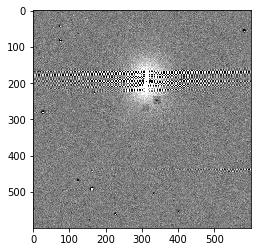

In [13]:
y1, y2 = (2000, 2600)
x1, x2 = (550, 1150)
plt.imshow(normalize(np.load("test_full_diff.npy")[y1:y2, x1:x2]), cmap="gray")

In [8]:
ref_image = fits.getdata("/media/rd1/ztf_neos/fits_files_resampled/ztf_20180322327384_000319_zr_c11_o_q2_sciimg.resamp.fits")
ref_image = ref_image.byteswap(True).newbyteorder()
sci_image = fits.getdata("/media/rd1/ztf_neos/fits_files_resampled/ztf_20180322327384_000319_zr_c11_o_q2_refimg.resamp.fits")
sci_image = sci_image.byteswap(True).newbyteorder()

In [50]:
ref_image = align(sci_image, ref_image)
# ref_image = normalize_brightness(sci_image, ref_aligned)

sci_image_cropped = sci_image[y1:y2, x1:x2]
# sci_image_cropped = sci_image_cropped.byteswap().newbyteorder()

ref_image_cropped = ref_image[y1:y2, x1:x2]
# ref_image_cropped = ref_image_cropped.byteswap().newbyteorder()

In [72]:
fake_sci_image = implant_random_streak(np.copy(sci_image_cropped))

404 488


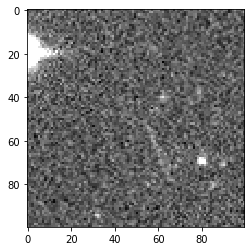

In [62]:
x = 127
y = 356
plt.imshow(normalize(fake_sci_image[y - 50:y + 50, x - 50:x + 50]), cmap="gray")

In [63]:
result = difference(fake_sci_image, ref_image)

Sources found = 21
stamps will be 19 x 19
Sources found = 48
stamps will be 17 x 17
using single psf, gaussian modeled
(48, 48, 21)
Matching result::  IDs > 0. => 12
p=2, q=12
[9.41603011 8.54121203]
('Masked pixels: ', 276)
updating stamp shape to (25,25)
('Masked pixels: ', 39)
updating stamp shape to (23,23)
Found that beta = [ 0.10000006 -0.00163502 -0.00419737]
Took only 52.84745407104492 awesome seconds
The solution was with cost 10.490537938875084
S_corr sigma_clipped_stats 
mean = 9.276084291692506e-06, median = 1.6556336125000087e-08, std = 7.985572135228083e-05

Subtraction performed in 57.20592021942139 seconds


cleaning... 
cleaning... 


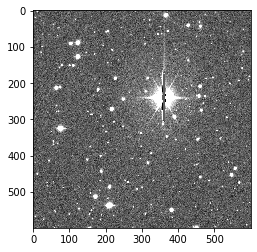

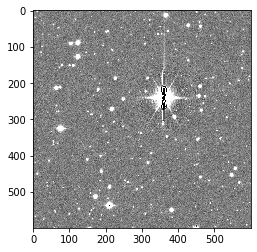

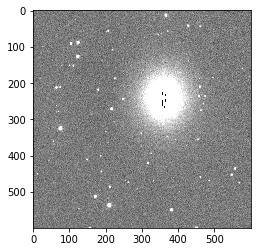

In [76]:
x = 127
y = 356
plt.imshow(normalize(sci_image_cropped), cmap="gray")
plt.figure()
plt.imshow(normalize(result), cmap="gray")
plt.figure()
plt.imshow(normalize(ref_image_cropped), cmap="gray")

In [41]:
result2 = difference(result, ref_image_cropped)

Sources found = 20
stamps will be 19 x 19
Sources found = 52
stamps will be 15 x 15
using single psf, gaussian modeled
(52, 52, 20)
Matching result::  IDs > 0. => 8
p=2, q=8
[8.85769732 9.030091  ]
('Masked pixels: ', 279)
updating stamp shape to (25,25)
('Masked pixels: ', 371)
updating stamp shape to (21,21)
Least squares could not find our beta  :(
Beta is overriden to be the zp ratio again
S_corr sigma_clipped_stats 
mean = -0.00018177406077840835, median = -4.1565989847653686e-08, std = 0.001590141067780172

Subtraction performed in 79.2789785861969 seconds


cleaning... 
cleaning... 


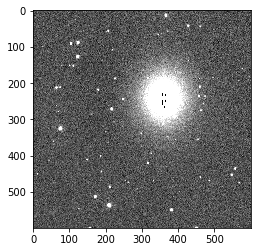

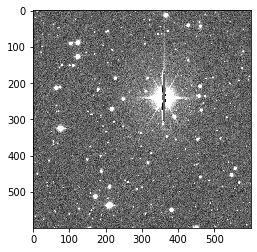

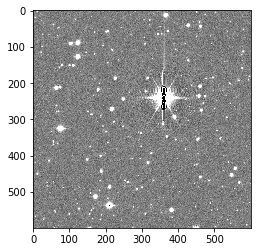

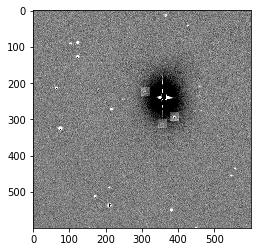

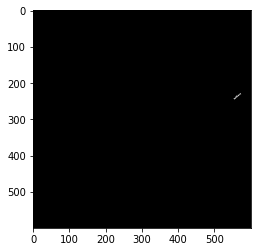

In [46]:
plt.imshow(normalize(ref_image[y1:y2, x1:x2]), cmap="gray")
plt.figure()
plt.imshow(normalize(fake_sci_image), cmap="gray")
plt.figure()
plt.imshow(normalize(result), cmap="gray")
plt.figure()
plt.imshow(normalize(result2), cmap="gray")
plt.figure()
plt.imshow(fake_sci_image - sci_image[y1:y2, x1:x2], cmap="gray")

In [40]:
np.save("test_part_diff.npy", result)

In [8]:
result = make_differenced_entire("/media/rd1/ztf_neos/fits_files_resampled/ztf_20180322327384_000319_zr_c11_o_q2_sciimg.resamp.fits",
    ref_path="/media/rd1/ztf_neos/fits_files_resampled/ztf_20180322327384_000319_zr_c11_o_q2_refimg.resamp.fits")

Sources found = 142110 (of max 10) [7.7 s/iter]
stamps will be 15 x 15
Sources found = 467
stamps will be 15 x 15
using single psf, gaussian modeled
(467, 467, 1421)
Matching result::  IDs > 0. => 187
p=2, q=187
[10.18214532 11.09632442]
('Masked pixels: ', 268)
updating stamp shape to (21,21)
('Masked pixels: ', 1750)
updating stamp shape to (21,21)
Found that beta = [ 0.42445733 -0.00332284 -0.03700513]
Took only 350.5896780490875 awesome seconds
The solution was with cost 0.6003375448285942
S_corr sigma_clipped_stats 
mean = -3.508494721849402e-07, median = -4.1686254359502016e-11, std = 7.299507886150286e-05

Subtraction performed in 437.6030123233795 seconds


MEAN: 4.37286962057351e-05 STD: 0.005922159130544288
cleaning... 
cleaning... 


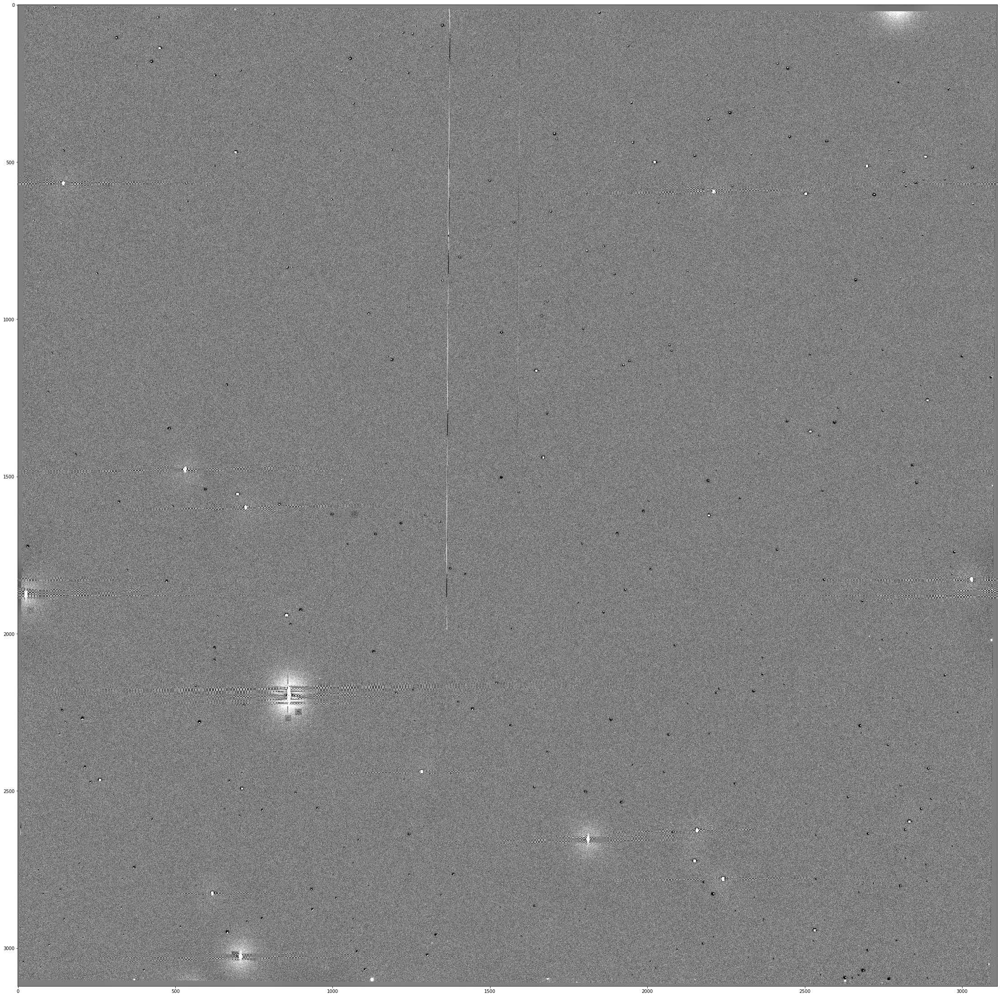

In [5]:
ref = fits.getdata("/media/rd1/ztf_neos/fits_files_resampled/ztf_20180322327384_000319_zr_c11_o_q2_refimg.resamp.fits")
sci = fits.getdata("/media/rd1/ztf_neos/fits_files_resampled/ztf_20180322327384_000319_zr_c11_o_q2_sciimg.resamp.fits")

plt.figure(figsize = (40,40))
plt.imshow(normalize(sci), cmap="gray")
plt.figure(figsize = (40,40))
plt.imshow(normalize(ref), cmap="gray")
plt.figure(figsize = (40,40))
plt.imshow(normalize(np.load("test_full_diff.npy")), cmap="gray")


In [14]:
np.save("test_full_diff.npy", result)

TypeError: expected str, bytes or os.PathLike object, not numpy.ndarray